# Winner boundary — who wins the build program, and where the advantage flips

**Purpose.** Decision support for **paper-plan issue 8** (the NLR regroup): the Monte Carlo in
`mc_cost_trajectories.ipynb` assigns each of 5,000 drawn "worlds" per deployment schedule a
**winner** — the technology (traditional **large** reactors or **SMR**s) that delivers the whole
build program at lower financed cost. This notebook examines *which parameters decide that
choice*, *how decisive it is*, and *where in parameter space the advantage flips* — so that both
experts and non-experts can weigh in on the three sub-decisions issue 8 defers to the regroup:

> **(a) Winner granularity** — keep a winner *per draw* (and report win probabilities), or force
> one winner *per trajectory*?
> **(b) Extraction distribution** — pick the P5/P50/P95 cases from the *winner-cost* distribution
> (current default) or from *per-tech* distributions?
> **(c) Ranking functional** — confirm the default (discounted, schedule-weighted financed
> CAPEX) against its alternatives.

**Prerequisite:** run `mc_cost_trajectories.ipynb` first — it writes `exports/mc_perdraw.npz`
(section S10b), which this notebook reads. Nothing here re-runs the MC engine.

### Glossary (read this once)

| term | meaning |
|---|---|
| **draw / world** | one joint sample of all uncertain parameters — one internally consistent future |
| **program cost `R`** | what the whole build program costs if one tech gets *every* reactor: financed CAPEX (\$/kW) weighted by each year's capacity additions and discounted to 2030 |
| **`R̄` (program-average)** | `R` divided by discounted program size — a plain **\$/kW** number, comparable across schedules |
| **margin `m`** | SMR's advantage. `m_usd = R̄_large − R̄_smr` (\$/kW); `m_pct` = the same as % of program cost |
| **`U0` — the learning dial** | one copula uniform drives *both* techs' learning rates (they are comonotone). `U0=0` → slow learning for both (3%); `U0=1` → fast for both (large 12%, SMR 16%) |
| **`U1` — the starting-cost dial** | one uniform drives *both* 2030 anchor costs. `U1=0` → cheap anchors (large \$5,250, SMR \$5,500/kW); `U1=1` → expensive (large \$7,750, SMR \$10,000/kW) |
| **comonotone** | despite 11 drawn parameters there are only **two independent cost dials** (`U0`, `U1`) plus a few switches — the flip boundary lives in a low-dimensional space |
| **`conv_full`** | experience-base convention, applied **per-tech**: does the legacy US large-reactor fleet count as prior experience *for large*? (`full-stock` = yes, `tiny-base` = no). SMRs never inherit the LWR stock — their empirically derived learning-rate range already embeds any benefit from prior LWR builds, and crediting the ~140-unit stock to the SMR base would double-count it and violate the zero cross-tech spillover convention |

### Sign convention — the one box to internalize

> **`m > 0` ⇒ SMR wins.** Every figure in this notebook puts SMR-advantage to the **right** (or
> up), colors **large = blue**, **SMR = orange**, and centers diverging color maps at the flip.

**Why this matters:** the winner is the technology ReEDS is *mandated to build* in all 18 paper
cases — the loser learns only from international spillover. Getting the winner rule right is
upstream of every subsidy number the paper reports.

## W1 — Data: from the MC's per-draw export to one analysis table

**The question.** None yet — this section loads the per-draw export and builds the one derived
table everything else reads: one row per draw, with the two dials, the raw parameters, both
program costs, the margin, and the winner.

**What you'll see.** A QA block proving this notebook's view of the data is *identical* to the
MC's own: win probabilities reproduce `exports/win_probabilities.csv` exactly, and the margin's
sign reproduces the winner label draw-by-draw (ties → large, as in the MC).

**How to read it.** From here on, a draw is a point: its horizontal position is how fast the
industry learns (`U0`), its vertical position is how expensive nuclear starts (`U1`), its color
is who wins, and its intensity is by how much.

In [1]:
import json
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap, TwoSlopeNorm
from scipy import stats
from scipy.ndimage import uniform_filter
import plotly.graph_objects as go
import plotly.io as pio

pio.renderers.default = "plotly_mimetype+notebook"

NB_DIR = Path.cwd() if Path.cwd().name == "mc" else Path("z-ethan/mc").resolve()
EXPORTS = NB_DIR / "exports"
NPZ = EXPORTS / "mc_perdraw.npz"
assert NPZ.exists(), ("exports/mc_perdraw.npz not found - run mc_cost_trajectories.ipynb "
                      "(section S10b) first; this notebook only analyzes, it never re-runs the MC")

Z = np.load(NPZ)
META = json.loads(str(Z["meta_json"]))
SCHED_ORDER = [str(s) for s in Z["sched_order"]]
TOK = dict(zip(SCHED_ORDER, [str(t) for t in Z["scen_tokens"]]))
WORLD_COLS = [str(c) for c in Z["world_columns"]]
YEARS, DISC = Z["years"], Z["disc"]
TECHS = ["large", "smr"]
REP = "McKinsey GEP 2025"        # representative schedule for single-panel deep dives (the MC's FRAG_SCHED)
EPS_CLOSE = 2.0                  # "close call" threshold, % of program cost (adopted in W2)

def yi(y):
    return int(np.where(YEARS == y)[0][0])

# --- palette: dataviz reference palette (light mode); large = blue, smr = orange, everywhere ---
C_LARGE, C_SMR = "#2a78d6", "#eb6834"
INK, INK2, MUTED = "#0b0b0b", "#52514e", "#898781"
GRID, BASE, SURFACE, NEUTRAL = "#e1e0d9", "#c3c2b7", "#fcfcfb", "#f0efec"
SEQ6 = ["#86b6ef", "#6da7ec", "#5598e7", "#3987e5", "#256abf", "#184f95"]   # ambition-ordered schedules
C_TINY, C_FULL = "#1baf7a", "#4a3aa7"    # experience-base strata (aqua / violet)
CMAP_DIV = LinearSegmentedColormap.from_list("large_smr", [C_LARGE, NEUTRAL, C_SMR])
TECH_COLOR = {"large": C_LARGE, "smr": C_SMR}

plt.rcParams.update({
    "figure.facecolor": SURFACE, "axes.facecolor": SURFACE, "savefig.facecolor": SURFACE,
    "axes.edgecolor": BASE, "axes.linewidth": 0.8, "axes.grid": True, "grid.color": GRID,
    "grid.linewidth": 0.6, "axes.axisbelow": True, "axes.spines.top": False,
    "axes.spines.right": False, "text.color": INK, "axes.labelcolor": INK2,
    "xtick.color": MUTED, "ytick.color": MUTED, "axes.titlecolor": INK,
    "font.size": 9.5, "axes.titlesize": 11, "figure.dpi": 110, "legend.frameon": False,
})

def plotly_layout(fig, **kw):
    fig.update_layout(paper_bgcolor=SURFACE, plot_bgcolor=SURFACE, font=dict(color=INK2, size=12),
                      title_font=dict(color=INK, size=15),
                      xaxis=dict(gridcolor=GRID, zerolinecolor=BASE),
                      yaxis=dict(gridcolor=GRID, zerolinecolor=BASE), **kw)
    return fig

print(f"loaded {NPZ.name}: {len(Z.files)} arrays | seed {META['master_seed']}, "
      f"{META['n_draws']} draws x {len(SCHED_ORDER)} schedules | "
      f"default functional: {META['ranking_functional_default']}")

loaded mc_perdraw.npz: 108 arrays | seed 20260715, 10000 draws x 6 schedules | default functional: discounted_schedule_weighted


In [2]:
# The master per-draw table D[sched]: parameters + dials + program costs + margin + winner.
D = {}
for s in SCHED_ORDER:
    t = TOK[s]
    d = pd.DataFrame(Z[f"worlds_{t}"], columns=WORLD_COLS)
    d["n_vendors"] = d["n_vendors"].astype(int)
    d["conv_full"] = d["conv_full"].astype(int)
    d["U0"] = (d["lr_large"] - 0.03) / 0.09          # the learning dial (copula uniform)
    d["U1"] = (d["boak_large"] - 5250.0) / 2500.0    # the starting-cost dial (copula uniform)
    Rl, Rs = Z[f"R_{t}_large"], Z[f"R_{t}_smr"]
    Wn = (Z[f"gw_additions_{t}"] / DISC).sum()       # discounted program size (GW) -> $/kW units
    d["R_large"], d["R_smr"] = Rl, Rs
    d["Rbar_large"], d["Rbar_smr"] = Rl / Wn, Rs / Wn
    d["m_usd"] = d["Rbar_large"] - d["Rbar_smr"]     # SMR advantage, $/kW program-average
    d["m_pct"] = 200.0 * (Rl - Rs) / (Rl + Rs)       # SMR advantage, % of program cost
    d["winner"] = Z[f"winners_{t}"]
    # QA: margin sign must reproduce the MC's winner labels exactly (ties -> large, as in S10)
    assert ((d["winner"] == "large") == (Rl <= Rs)).all(), s
    # QA: the dials really are the only cost axes (comonotone marginals)
    assert np.allclose(d["boak_smr"], 5500.0 + 4500.0 * d["U1"])
    assert np.allclose(d["lr_smr"], 0.03 + 0.13 * d["U0"])
    D[s] = d

# QA: reproduce the MC's exported win probabilities to the penny
wp = pd.read_csv(EXPORTS / "win_probabilities.csv", index_col=0)
for s in SCHED_ORDER:
    # csv stores round(3) values, so the true gap can be exactly 5e-4 (hit 2026-08-06:
    # P(smr)=0.7935 vs stored 0.794) - the bound must be inclusive of that half-ulp
    assert abs((D[s]["winner"] == "smr").mean() - wp.loc[s, "P(smr wins)"]) <= 5e-4 + 1e-9, s
print("QA green: winner labels, win probabilities, and comonotone dials all reproduce the MC exactly")

SELECTED = pd.read_csv(EXPORTS / "selected_draws.csv", index_col=0)   # the 18 exported ReEDS cases
D[REP][["lr_large", "boak_large", "U0", "U1", "conv_full", "n_vendors",
        "Rbar_large", "Rbar_smr", "m_usd", "m_pct", "winner"]].head(6).round(3)

QA green: winner labels, win probabilities, and comonotone dials all reproduce the MC exactly


,lr_large,boak_large,U0,U1,conv_full,n_vendors,Rbar_large,Rbar_smr,m_usd,m_pct,winner
0,0.057,5867.458,0.305,0.247,0,7,7592.698,6764.018,828.680,11.544,smr
1,0.100,6013.539,0.775,0.305,0,4,6196.138,4751.133,1445.006,26.399,smr
2,0.072,6486.648,0.470,0.495,1,7,9230.803,7521.366,1709.437,20.409,smr
3,0.050,5889.532,0.228,0.256,1,6,8178.907,7011.592,1167.315,15.369,smr
4,0.033,7048.216,0.038,0.719,0,7,9672.374,9993.306,-320.932,-3.264,large
5,0.073,5603.365,0.474,0.141,1,6,8285.758,5696.427,2589.331,37.038,smr


## W2 — Headline: how often each tech wins, and by how much

**The question.** Is the winner-take-all choice usually decisive or usually narrow? If margins
were mostly huge, none of the issue-8 sub-decisions would matter much; if mostly narrow, all
three would.

**What you'll see.** SMR wins ~87–90% of worlds, broadly rising with schedule ambition — the
large-wins tail is confined to slow-learning, expensive-anchor worlds, and a minority of draws
are *close calls*. In the interactive scatter, each point is one world plotted by its two
program costs; the 45° line **is** the flip boundary in outcome space, and distance from the
line is the margin.

**How to read it.** Left panel: distributions of the margin `m_pct` (SMR advantage, % of program
cost) — mass right of zero = SMR-winning worlds. Right panel: the cumulative view for the
representative schedule with the close-call bands shaded. In the scatter below, hover any point
for that world's full parameter draw; stars are the 18 exported ReEDS cases.

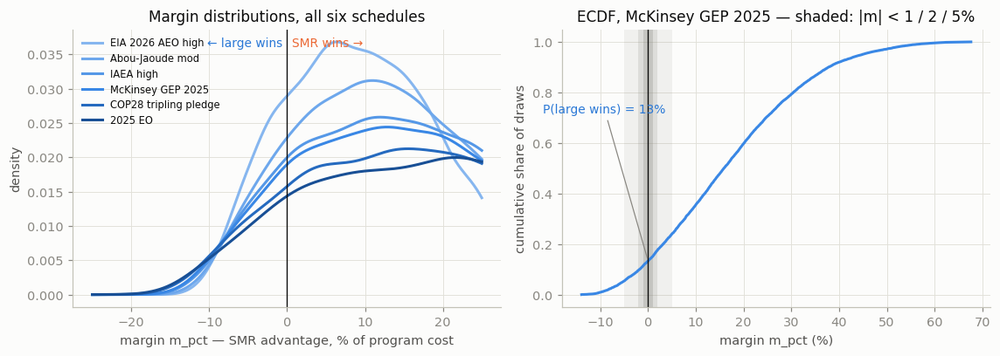

,P(smr wins),median m_pct (%),median m_usd ($/kW),IQR m_pct,share |m|<1%,share |m|<2%,share |m|<5%
EIA 2026 AEO high,0.819,9.255,817.061,14.404,0.057,0.116,0.286
Abou-Jaoude mod,0.854,12.375,1033.308,17.254,0.046,0.090,0.225
IAEA high,0.863,14.955,1161.309,20.403,0.041,0.083,0.195
McKinsey GEP 2025,0.867,15.874,1176.441,21.874,0.037,0.080,0.187
COP28 tripling pledge,0.878,18.940,1288.372,25.622,0.031,0.063,0.159
2025 EO,0.886,21.407,1347.426,27.059,0.028,0.059,0.143


In [3]:
fig, axes = plt.subplots(1, 2, figsize=(10.5, 3.8))

ax = axes[0]
xg = np.linspace(-25, 25, 400)
for c, s in zip(SEQ6, SCHED_ORDER):
    kde = stats.gaussian_kde(D[s]["m_pct"])
    ax.plot(xg, kde(xg), color=c, lw=2, label=s)
ax.axvline(0, color=INK, lw=0.9)
ax.text(0.6, ax.get_ylim()[1] * 0.97, "SMR wins →", color=C_SMR, fontsize=9, va="top")
ax.text(-0.6, ax.get_ylim()[1] * 0.97, "← large wins", color=C_LARGE, fontsize=9, va="top", ha="right")
ax.set_xlabel("margin m_pct — SMR advantage, % of program cost")
ax.set_ylabel("density")
ax.set_title("Margin distributions, all six schedules")
ax.legend(fontsize=7.5, loc="upper left")

ax = axes[1]
m = np.sort(D[REP]["m_pct"].to_numpy())
ax.plot(m, np.arange(1, len(m) + 1) / len(m), color=SEQ6[3], lw=2)
for eps, a in ((5, 0.10), (2, 0.18), (1, 0.28)):
    ax.axvspan(-eps, eps, color=MUTED, alpha=a, lw=0)
ax.axvline(0, color=INK, lw=0.9)
p_large = (D[REP]["m_pct"] < 0).mean()
ax.annotate(f"P(large wins) = {p_large:.0%}", xy=(0, p_large), xytext=(-22, 0.72),
            color=C_LARGE, fontsize=9, arrowprops=dict(arrowstyle="-", color=MUTED, lw=0.8))
ax.set_xlabel("margin m_pct (%)")
ax.set_ylabel("cumulative share of draws")
ax.set_title(f"ECDF, {REP} — shaded: |m| < 1 / 2 / 5%")
plt.tight_layout()
plt.show()

tab = {}
for s in SCHED_ORDER:
    d = D[s]
    tab[s] = {"P(smr wins)": (d["winner"] == "smr").mean(),
              "median m_pct (%)": d["m_pct"].median(),
              "median m_usd ($/kW)": d["m_usd"].median(),
              "IQR m_pct": d["m_pct"].quantile(0.75) - d["m_pct"].quantile(0.25),
              "share |m|<1%": (d["m_pct"].abs() < 1).mean(),
              "share |m|<2%": (d["m_pct"].abs() < 2).mean(),
              "share |m|<5%": (d["m_pct"].abs() < 5).mean()}
W2_TABLE = pd.DataFrame(tab).T.round(3)
W2_TABLE.to_csv(EXPORTS / "wb_headline.csv")
W2_TABLE

In [4]:
# Outcome space: each world's two program costs; the 45-degree line IS the flip boundary.
d = D[REP]
hover_cols = ["lr_large", "lr_smr", "boak_large", "boak_smr", "n_vendors", "conv_full",
              "u", "s", "dur_lambda", "dur_z", "m_usd", "m_pct"]
cd = d[hover_cols].round(3).to_numpy()
ht = ("R̄ large %{x:,.0f} | R̄ smr %{y:,.0f} $/kW<br>"
      "lr %{customdata[0]:.3f}/%{customdata[1]:.3f} | BOAK %{customdata[2]:,.0f}/%{customdata[3]:,.0f}<br>"
      "vendors %{customdata[4]} | conv_full %{customdata[5]} | u %{customdata[6]:.2f} | s %{customdata[7]:.2f}<br>"
      "margin %{customdata[10]:,.0f} $/kW (%{customdata[11]:.1f}%)<extra>%{text}</extra>")

fig = go.Figure()
for tech in TECHS:
    mk = (d["winner"] == tech).to_numpy()
    fig.add_trace(go.Scattergl(
        x=d.loc[mk, "Rbar_large"], y=d.loc[mk, "Rbar_smr"], mode="markers",
        name=f"{tech} wins", text=[f"{tech} wins"] * mk.sum(), customdata=cd[mk],
        marker=dict(color=TECH_COLOR[tech], size=4, opacity=0.45), hovertemplate=ht))

lo = min(d["Rbar_large"].min(), d["Rbar_smr"].min()) * 0.97
hi = max(d["Rbar_large"].max(), d["Rbar_smr"].max()) * 1.02
fig.add_trace(go.Scatter(x=[lo, hi], y=[lo, hi], mode="lines",
                         line=dict(color=INK, width=1.2), name="flip boundary (45°)",
                         hoverinfo="skip"))

# the 18 exported ReEDS cases (all schedules - same $/kW units)
cs = SELECTED.reset_index()
cx = [D[r["schedule"]].loc[int(r["draw"]), "Rbar_large"] for _, r in cs.iterrows()]
cy = [D[r["schedule"]].loc[int(r["draw"]), "Rbar_smr"] for _, r in cs.iterrows()]
fig.add_trace(go.Scatter(
    x=cx, y=cy, mode="markers", name="18 exported cases",
    text=[f"{r['case']} ({r['schedule']}, {r['percentile']}, winner {r['winner']})"
          for _, r in cs.iterrows()],
    marker=dict(symbol="star", size=13, color=[TECH_COLOR[w] for w in cs["winner"]],
                line=dict(color=INK, width=1)),
    hovertemplate="%{text}<br>R̄ large %{x:,.0f} | R̄ smr %{y:,.0f} $/kW<extra></extra>"))

fig.add_annotation(x=0.97, y=0.06, xref="paper", yref="paper", showarrow=False,
                   text="below the line: SMR cheaper → SMR wins", font=dict(color=C_SMR, size=12))
fig.add_annotation(x=0.03, y=0.94, xref="paper", yref="paper", showarrow=False,
                   text="above the line: large cheaper → large wins", font=dict(color=C_LARGE, size=12))
plotly_layout(fig, title=f"Outcome space, {REP} (cloud) + all 18 exported cases (stars)",
              xaxis_title="R̄ large — program-average financed CAPEX if large builds everything ($/kW)",
              yaxis_title="R̄ SMR — same, if SMR builds everything ($/kW)",
              width=820, height=640, legend=dict(orientation="h", y=1.06))
fig.show()

cnt = SELECTED.pivot_table(index="percentile", columns="winner", values="draw",
                           aggfunc="count").fillna(0).astype(int)
print("Winner of the 18 exported cases by percentile (the issue-8b phenomenon - cheap "
      "percentiles pick SMR worlds, the expensive tail leans toward large worlds; W8b explains "
      "why that is structural):")
print(cnt.to_string())

Winner of the 18 exported cases by percentile (the issue-8b phenomenon - cheap percentiles pick SMR worlds, the expensive tail leans toward large worlds; W8b explains why that is structural):
winner      large  smr
percentile            
p05             0    6
p50             0    6
p95             1    5


## W3 — What moves the winner

**The question.** Which of the 11 drawn parameters actually decide the outcome? (This justifies
collapsing the boundary maps to the two dials plus one switch.) The MC's own tornado (S14) asked
*what makes nuclear expensive*; this one asks *what makes SMR win* — a different question, and
the ranking changes accordingly.

**What you'll see.** Three parameters dominate: the starting-cost dial (`boak_large`/`U1`,
pushing toward **large**), the learning dial (`lr_large`/`U0`, pushing toward **SMR** — the
shared dial stretches SMR's wider learning-rate range further), and the experience-base
convention (`conv_full`, pushing toward **SMR**, which may surprise: crediting the ~140-unit
legacy fleet to large's base puts large far along its learning curve, so each *new* large build
adds little relative experience — full-stock handicaps large's learning progression while SMR,
never credited with the LWR stock, always starts steep). International-spillover parameters
(`u`, `s`) and the CES structure (`ces_rho`) are near-null *for the choice* even though they
matter for cost levels.

**How to read it.** Top: bars = Spearman rank correlation with the margin for the representative
schedule; dots = the other five schedules (robustness at a glance). Bottom: P(SMR wins) by
parameter decile — a steep curve means the parameter moves the choice; a flat line at the
overall win rate means it does not. The table decomposes the *median* margin into its OCC
(learning) and financing (duration/IDC) parts.

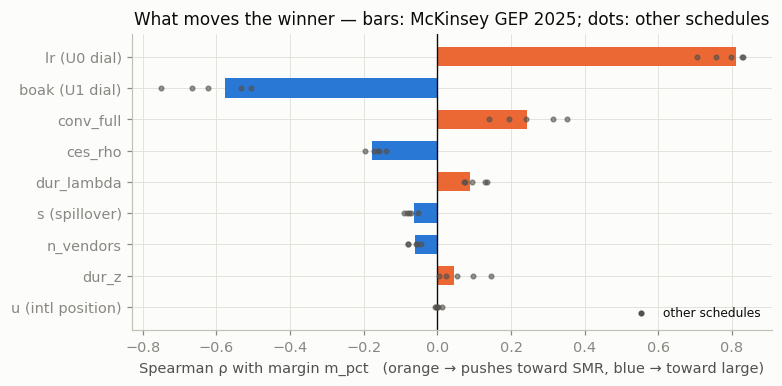

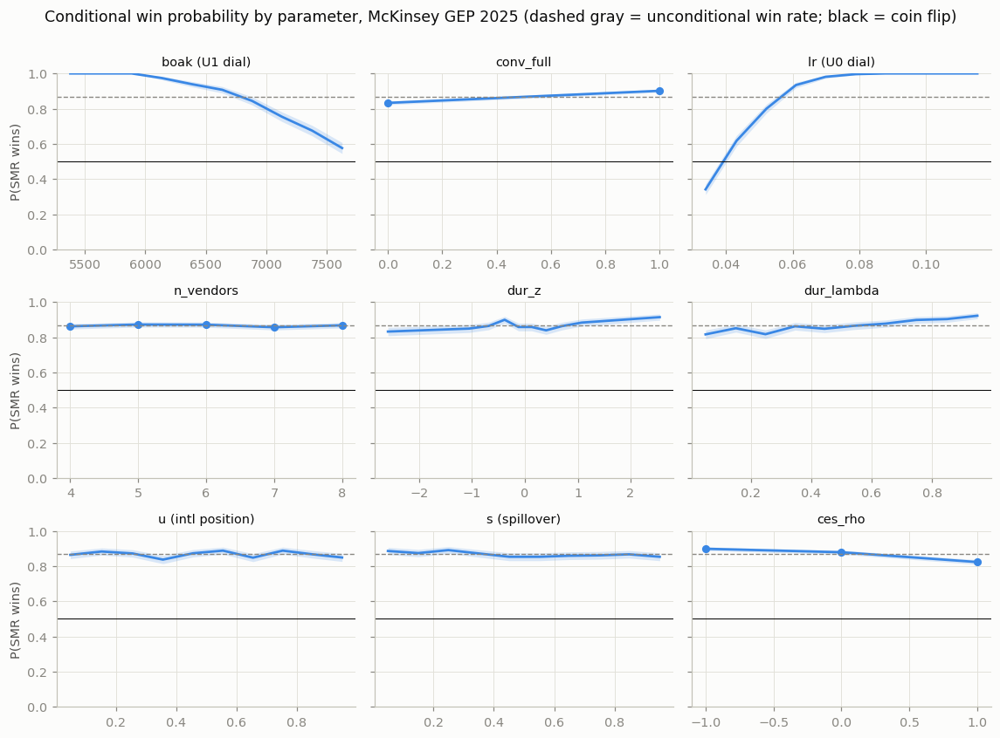

In [5]:
PARAMS9 = ["boak_large", "conv_full", "lr_large", "n_vendors", "dur_z", "dur_lambda", "u", "s", "ces_rho"]
NICE = {"boak_large": "boak (U1 dial)", "conv_full": "conv_full", "lr_large": "lr (U0 dial)",
        "n_vendors": "n_vendors", "dur_z": "dur_z", "dur_lambda": "dur_lambda",
        "u": "u (intl position)", "s": "s (spillover)", "ces_rho": "ces_rho"}

rho = pd.DataFrame({s: {p: stats.spearmanr(D[s][p], D[s]["m_pct"]).correlation for p in PARAMS9}
                    for s in SCHED_ORDER})
order = rho[REP].abs().sort_values().index

fig, ax = plt.subplots(figsize=(7.2, 3.6))
ax.barh([NICE[p] for p in order], rho.loc[order, REP],
        color=[C_SMR if v > 0 else C_LARGE for v in rho.loc[order, REP]], height=0.62)
for s in SCHED_ORDER:
    if s != REP:
        ax.scatter(rho.loc[order, s], range(len(order)), color=INK2, s=9, zorder=3, alpha=0.6)
ax.axvline(0, color=INK, lw=0.9)
ax.set_xlabel("Spearman ρ with margin m_pct   (orange → pushes toward SMR, blue → toward large)")
ax.set_title(f"What moves the winner — bars: {REP}; dots: other schedules")
ax.scatter([], [], color=INK2, s=9, label="other schedules")
ax.legend(loc="lower right", fontsize=8)
plt.tight_layout()
plt.show()

fig, axes = plt.subplots(3, 3, figsize=(10.5, 7.6), sharey=True)
d = D[REP]
p0 = (d["winner"] == "smr").mean()
for ax, p in zip(axes.ravel(), PARAMS9):
    if d[p].nunique() <= 8:                                    # discrete switches: group by value
        g = d.groupby(p)["winner"].agg(lambda w: (w == "smr").mean())
        n = d.groupby(p).size()
        x, y = g.index.to_numpy(dtype=float), g.to_numpy()
        ax.plot(x, y, "o-", color=SEQ6[3], lw=1.8, ms=5)
    else:                                                      # continuous: deciles
        q = pd.qcut(d[p], 10)
        g = d.groupby(q, observed=True)["winner"].agg(lambda w: (w == "smr").mean())
        n = d.groupby(q, observed=True).size()
        x = [iv.mid for iv in g.index]
        y = g.to_numpy()
        ax.plot(x, y, "-", color=SEQ6[3], lw=1.8)
    se = 2 * np.sqrt(np.asarray(y) * (1 - np.asarray(y)) / n.to_numpy())
    ax.fill_between(x, np.asarray(y) - se, np.asarray(y) + se, color=SEQ6[3], alpha=0.18, lw=0)
    ax.axhline(p0, color=MUTED, lw=0.9, ls="--")
    ax.axhline(0.5, color=INK, lw=0.7)
    ax.set_title(NICE[p], fontsize=9.5)
    ax.set_ylim(0, 1)
axes[0, 0].set_ylabel("P(SMR wins)")
axes[1, 0].set_ylabel("P(SMR wins)")
axes[2, 0].set_ylabel("P(SMR wins)")
fig.suptitle(f"Conditional win probability by parameter, {REP} "
             "(dashed gray = unconditional win rate; black = coin flip)", y=1.005)
plt.tight_layout()
plt.show()

In [6]:
# Margin decomposition: how much of SMR's advantage is OCC learning vs financing (duration/IDC)?
# Recompute the program score on OCC alone with the same weights; the remainder of the full
# margin is the financing wedge (ccmult x fin_mult applied to the OCC gap + duration advantage).
rows = []
for s in SCHED_ORDER:
    t, d = TOK[s], D[s]
    w = Z[f"gw_additions_{t}"] / DISC
    m_occ = 200.0 * ((Z[f"occ_{t}_large"] @ w) - (Z[f"occ_{t}_smr"] @ w)) / \
            ((Z[f"occ_{t}_large"] @ w) + (Z[f"occ_{t}_smr"] @ w))
    m_fin = d["m_pct"].to_numpy() - m_occ
    med_occ, med_fin = np.median(m_occ), np.median(m_fin)
    rows.append({"schedule": s, "median m_pct (%)": d["m_pct"].median(),
                 "OCC-only part (pp)": med_occ, "financing part (pp)": med_fin})
W3_DECOMP = pd.DataFrame(rows).set_index("schedule").round(2)
print("Margin decomposition (medians, percentage points of program cost; financing = shorter "
      "builds -> less IDC,\nplus the tech financing multipliers).")
if (W3_DECOMP["OCC-only part (pp)"] < 0).all():
    print("Note the SIGN: the OCC-only margin is NEGATIVE - on overnight cost alone, large "
          "would usually win.\nSMR's advantage is delivered entirely by the financing wedge: "
          "SMR wins on build speed.")
elif (W3_DECOMP["financing part (pp)"] > W3_DECOMP["OCC-only part (pp)"]).all():
    print("The financing wedge is the larger component in every schedule: SMR's advantage is "
          "financing-led\n(build speed), with OCC learning contributing the rest.")
W3_DECOMP

Margin decomposition (medians, percentage points of program cost; financing = shorter builds -> less IDC,
plus the tech financing multipliers).


,median m_pct (%),OCC-only part (pp),financing part (pp)
schedule,,,
EIA 2026 AEO high,9.26,-4.45,13.35
Abou-Jaoude mod,12.37,0.03,12.08
IAEA high,14.95,4.81,9.87
McKinsey GEP 2025,15.87,6.96,8.63
COP28 tripling pledge,18.94,11.92,6.85
2025 EO,21.41,15.44,5.84


## W4 — The two-dial map: the flip boundary in (U0, U1)

**The question.** Where in the two independent cost dials does the advantage flip? This is the
notebook's core figure.

**What you'll see.** Most of the square is orange: since the per-tech experience-base fix, SMR
wins everywhere except the slow-learning corner — blue survives only at low `U0`, and even
there mostly at high anchor costs. The ridge between the regions is the boundary. It is
*diffuse*, not sharp: the pooled map mixes the two experience-base conventions, whose
boundaries sit in different places (W5 un-mixes them), and the remaining switches add noise.
Contours are drawn from lightly smoothed grids so the eye can follow them.

**How to read it.** Panel A colors each bin of (U0, U1) by the *share of draws SMR wins*
(diverging map centered at 50%); the black line is the empirical 50% contour. Panel B colors
the same bins by the *median margin* and draws its zero contour — a lower-variance estimate of
the same boundary, because the margin is continuous while win/lose is binary. The two contours
agreeing is a built-in sanity check.

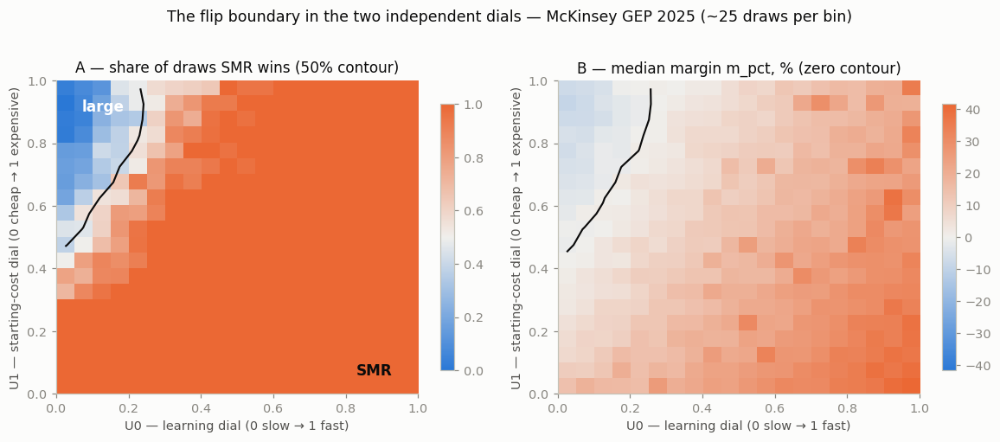

In [7]:
def binned_grid(d, value, mask=None, nbins=20, stat="median"):
    """Bin draws on the (U0, U1) unit square; return bin centers, the binned statistic
    grid[iy, ix], and the per-bin count."""
    m = np.ones(len(d), bool) if mask is None else np.asarray(mask)
    x, y = d["U0"].to_numpy()[m], d["U1"].to_numpy()[m]
    v = (d[value].to_numpy()[m] if isinstance(value, str) else np.asarray(value)[m]).astype(float)
    edges = np.linspace(0, 1, nbins + 1)
    ix = np.clip(np.digitize(x, edges) - 1, 0, nbins - 1)
    iy = np.clip(np.digitize(y, edges) - 1, 0, nbins - 1)
    grid = np.full((nbins, nbins), np.nan)
    cnt = np.zeros((nbins, nbins), int)
    for j in range(nbins):
        for i in range(nbins):
            sel = (ix == i) & (iy == j)
            cnt[j, i] = sel.sum()
            if sel.any():
                grid[j, i] = np.median(v[sel]) if stat == "median" else v[sel].mean()
    return 0.5 * (edges[:-1] + edges[1:]), grid, cnt

def smooth_grid(grid):
    """Light 3x3 smoothing for contour/boundary extraction (NaN bins filled with the median)."""
    filled = np.where(np.isnan(grid), np.nanmedian(grid), grid)
    return uniform_filter(filled, size=3, mode="nearest")

def boundary_from_grid(centers, grid):
    """U1*(U0): where the (monotone-decreasing-in-U1) margin grid crosses zero, per U0 column."""
    u1s = np.full(len(centers), np.nan)
    for i in range(len(centers)):
        col = grid[:, i]
        ok = ~np.isnan(col)
        if ok.sum() < 3:
            continue
        yv, vv = centers[ok], col[ok]
        if vv.min() < 0 < vv.max():
            u1s[i] = np.interp(0.0, vv[::-1], yv[::-1])
    return u1s

def boundary_curve(d, mask=None, nbins=12):
    """Smoothed zero-margin boundary for a stratum: (bin centers, U1*, U0_exit).
    U0_exit = the learning-dial value beyond which the whole column is SMR-positive
    (the boundary leaves the sampled anchor range); NaN if that never happens."""
    cc, g, _ = binned_grid(d, "m_pct", mask=mask, nbins=nbins)
    gs = smooth_grid(g)
    u1s = boundary_from_grid(cc, gs)
    all_smr = np.array([np.nanmin(gs[:, i]) > 0 for i in range(len(cc))])
    exit_idx = np.argmax(all_smr) if all_smr.any() else None
    u0_exit = cc[exit_idx] if (exit_idx is not None and all_smr[exit_idx:].all()) else np.nan
    return cc, u1s, u0_exit

d = D[REP]
C20, WIN_GRID, CNT = binned_grid(d, (d["winner"] == "smr").to_numpy(), nbins=20, stat="mean")
_, MARGIN_GRID, _ = binned_grid(d, "m_pct", nbins=20)
U1STAR_POOLED = boundary_from_grid(C20, smooth_grid(MARGIN_GRID))

fig, axes = plt.subplots(1, 2, figsize=(10.8, 4.5))
X, Y = np.meshgrid(C20, C20)
for ax, grid, ttl, norm, lvl in (
        (axes[0], WIN_GRID, "A — share of draws SMR wins (50% contour)",
         TwoSlopeNorm(vcenter=0.5, vmin=0, vmax=1), [0.5]),
        (axes[1], MARGIN_GRID, "B — median margin m_pct, % (zero contour)",
         TwoSlopeNorm(vcenter=0.0, vmin=-np.nanmax(np.abs(MARGIN_GRID)),
                      vmax=np.nanmax(np.abs(MARGIN_GRID))), [0.0])):
    im = ax.imshow(grid, origin="lower", extent=[0, 1, 0, 1], cmap=CMAP_DIV, norm=norm,
                   aspect="auto", interpolation="nearest")
    ax.contour(X, Y, smooth_grid(grid), levels=lvl, colors=[INK], linewidths=1.4)
    ax.set_xlabel("U0 — learning dial (0 slow → 1 fast)")
    ax.set_ylabel("U1 — starting-cost dial (0 cheap → 1 expensive)")
    ax.set_title(ttl)
    ax.grid(False)
    plt.colorbar(im, ax=ax, shrink=0.85)
axes[0].text(0.93, 0.06, "SMR", color=INK, fontsize=11, ha="right", fontweight="bold")
axes[0].text(0.07, 0.94, "large", color="white", fontsize=11, fontweight="bold", va="top")
fig.suptitle(f"The flip boundary in the two independent dials — {REP} "
             f"(~{CNT.mean():.0f} draws per bin)", y=1.02)
plt.tight_layout()
plt.show()

## W5 — Un-smearing the boundary: the experience-base convention and vendor count

**The question.** How much do the discrete switches move the boundary — is the flip a two-variable
story, or genuinely higher-dimensional?

**What you'll see.** The experience-base convention (`conv_full`) moves the boundary
substantially, and in the direction W3 flagged: **tiny-base is large's better case** (large
starts steep and can learn its way down), so the tiny-base boundary reaches furthest into the
square; under **full-stock** (the legacy fleet credited to large's base dilutes large's own
learning progression) the boundary collapses into the extreme slow-learning corner. Both lines
*leave the sampled anchor range* at modest learning: where a line stops, SMR wins at any
starting cost considered beyond it. Vendor count barely moves either line.
Conclusion: the boundary is effectively **three-dimensional — (U0, U1, conv_full)** — which is
exactly what the 3D figure in W6 shows.

**How to read it.** Each line is the zero-margin boundary for one stratum of draws; SMR wins
*below* a line, large wins *above* it. Color = convention (aqua tiny-base, violet full-stock);
solid = 4–5 vendors, dashed = 6–8; gray = all draws pooled (the W4 contour). The table converts
boundary heights into break-even dollars: the anchor cost at which the advantage flips, and the
SMR premium that implies (both anchors move together on the `U1` dial: large \$5,250–7,750,
SMR \$5,500–10,000 ⇒ premium at the boundary = 250 + 2,000·U1* \$/kW).

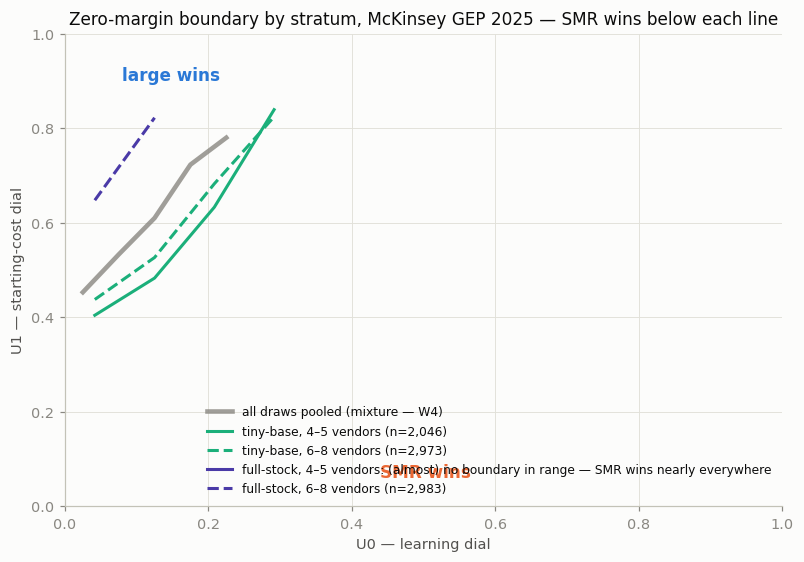

Where a tiny-base line stops, the boundary has left the sampled anchor range: to the right of it, SMR wins at ANY anchor cost in the ranges considered.
tiny-base: boundary leaves the sampled range at U0 ≈ 0.38 (lr_large ≈ 6.4%) — beyond that, SMR wins at any anchor.
full-stock: boundary leaves the sampled range at U0 ≈ 0.21 (lr_large ≈ 4.9%) — beyond that, SMR wins at any anchor.
Break-even anchors (NaN = no flip in the sampled range at that U0):


,convention,U0,lr_large at U0 (%),break-even U1*,break-even boak_large ($/kW),break-even boak_smr ($/kW),break-even SMR premium ($/kW)
0,tiny-base,0.1,3.9,0.48,6457.21,7672.99,1215.77
1,tiny-base,0.2,4.8,0.65,6874.49,8424.09,1549.59
2,tiny-base,0.3,5.7,0.83,7322.97,9231.35,1908.38
3,full-stock,0.1,3.9,0.79,7230.26,9064.47,1834.21
4,full-stock,0.2,4.8,NaN,NaN,NaN,NaN
5,full-stock,0.3,5.7,NaN,NaN,NaN,NaN


In [8]:
d = D[REP]
STRATA = [("tiny-base, 4–5 vendors", (d["conv_full"] == 0) & (d["n_vendors"] <= 5), C_TINY, "-"),
          ("tiny-base, 6–8 vendors", (d["conv_full"] == 0) & (d["n_vendors"] >= 6), C_TINY, "--"),
          ("full-stock, 4–5 vendors", (d["conv_full"] == 1) & (d["n_vendors"] <= 5), C_FULL, "-"),
          ("full-stock, 6–8 vendors", (d["conv_full"] == 1) & (d["n_vendors"] >= 6), C_FULL, "--")]

fig, ax = plt.subplots(figsize=(7.4, 5.2))
ax.plot(C20, U1STAR_POOLED, color=MUTED, lw=3, alpha=0.8, label="all draws pooled (mixture — W4)")
for name, mask, c, ls in STRATA:
    cc, u1s, _ = boundary_curve(d, mask=mask.to_numpy(), nbins=12)
    if (~np.isnan(u1s)).sum() < 2:
        ax.plot([], [], color=c, ls=ls, lw=2,
                label=f"{name}: (almost) no boundary in range — SMR wins nearly everywhere")
    else:
        ax.plot(cc, u1s, color=c, ls=ls, lw=2, label=f"{name} (n={mask.sum():,})")
ax.set_xlim(0, 1); ax.set_ylim(0, 1)
ax.set_xlabel("U0 — learning dial")
ax.set_ylabel("U1 — starting-cost dial")
ax.set_title(f"Zero-margin boundary by stratum, {REP} — SMR wins below each line")
ax.text(0.44, 0.06, "SMR wins", color=C_SMR, fontsize=11, fontweight="bold")
ax.text(0.08, 0.9, "large wins", color=C_LARGE, fontsize=11, fontweight="bold")
ax.legend(fontsize=8, loc="lower right")
plt.tight_layout()
plt.show()
print("Where a tiny-base line stops, the boundary has left the sampled anchor range: to the "
      "right of it, SMR wins at ANY anchor cost in the ranges considered.")

# Break-even dollars: boundary height -> anchor cost -> implied SMR premium.
# NaN = no break-even in range (SMR wins at any sampled anchor at that learning-dial value).
U0_EXIT = {}
rows = []
for conv, label in ((0, "tiny-base"), (1, "full-stock")):
    mask = (d["conv_full"] == conv).to_numpy()
    cc, u1s, u0_exit = boundary_curve(d, mask=mask, nbins=12)
    U0_EXIT[label] = u0_exit
    ok = ~np.isnan(u1s)
    for u0 in (0.10, 0.20, 0.30):
        in_range = ok.sum() > 1 and cc[ok].min() - 0.05 <= u0 <= cc[ok].max() + 0.05
        u1 = np.interp(u0, cc[ok], u1s[ok]) if in_range else np.nan
        rows.append({"convention": label, "U0": u0,
                     "lr_large at U0 (%)": 100 * (0.03 + 0.09 * u0),
                     "break-even U1*": u1,
                     "break-even boak_large ($/kW)": 5250 + 2500 * u1,
                     "break-even boak_smr ($/kW)": 5500 + 4500 * u1,
                     "break-even SMR premium ($/kW)": 250 + 2000 * u1})
W5_BREAKEVEN = pd.DataFrame(rows).round(2)
W5_BREAKEVEN.to_csv(EXPORTS / "wb_breakeven.csv", index=False)
for label, ex in U0_EXIT.items():
    if np.isfinite(ex):
        print(f"{label}: boundary leaves the sampled range at U0 ≈ {ex:.2f} "
              f"(lr_large ≈ {100 * (0.03 + 0.09 * ex):.1f}%) — beyond that, SMR wins at any anchor.")
print("Break-even anchors (NaN = no flip in the sampled range at that U0):")
W5_BREAKEVEN

## W6 — The boundary in 3D (rotate it)

**The question.** None new — this is the pedagogical centerpiece for the regroup: the same
boundary as W4/W5, but rotatable, so the "surface pierces the zero sheet" geometry is visible
directly.

**How to read it.** The vertical axis is the margin (SMR advantage, % of program cost). Two
surfaces = the two experience-base conventions. The flat gray sheet is `m = 0`: **the winner
flips exactly where a surface pierces the sheet.** The full-stock surface (violet) floats above
the sheet almost everywhere — with large's learning diluted by the legacy-fleet credit, SMR
rarely loses; the tiny-base surface (aqua) dips below the sheet over the slow-learning corner —
the same picture W5 showed in 2D. In the scatter below, every point is one world (a 1,500-draw
subsample); hover for its full parameter draw; diamonds are the 18 exported cases.

In [9]:
d = D[REP]
fig = go.Figure()
for conv, name, color in ((0, "tiny-base", C_TINY), (1, "full-stock", C_FULL)):
    cc, g, _ = binned_grid(d, "m_pct", mask=(d["conv_full"] == conv).to_numpy(), nbins=14)
    filled = np.where(np.isnan(g), np.nanmedian(g), g)          # fill rare empty bins for smoothing
    gs = uniform_filter(filled, size=3, mode="nearest")          # light 3x3 smoothing for display
    fig.add_trace(go.Surface(
        x=cc, y=cc, z=gs, name=name, showscale=False, opacity=0.92,
        colorscale=[[0, color], [1, color]],
        hovertemplate=("U0 %{x:.2f} | U1 %{y:.2f} | median margin %{z:.1f}%"
                       f"<extra>{name}</extra>")))
cc0 = np.linspace(0, 1, 2)
fig.add_trace(go.Surface(x=cc0, y=cc0, z=np.zeros((2, 2)), showscale=False, opacity=0.35,
                         colorscale=[[0, MUTED], [1, MUTED]], name="m = 0",
                         hovertemplate="the flip sheet: m = 0<extra></extra>"))
plotly_layout(fig, title="Median margin surface by experience-base convention — "
                         "the winner flips where a surface pierces the gray sheet",
              width=840, height=640)
fig.update_layout(scene=dict(
    xaxis=dict(title="U0 — learning dial →", gridcolor=GRID, backgroundcolor=SURFACE),
    yaxis=dict(title="U1 — starting-cost dial →", gridcolor=GRID, backgroundcolor=SURFACE),
    zaxis=dict(title="SMR advantage (% of program cost)", gridcolor=GRID, backgroundcolor=SURFACE),
    camera=dict(eye=dict(x=-1.6, y=-1.6, z=0.9))))
fig.show()
print("Legend: aqua = tiny-base, violet = full-stock, gray sheet = the flip (m = 0). "
      "Drag to rotate; the violet (full-stock) surface floats above the sheet almost "
      "everywhere, while the aqua (tiny-base) surface dips below it in the slow-learning "
      "corner - large's best case is the convention that does NOT credit it with the "
      "legacy fleet.")

Legend: aqua = tiny-base, violet = full-stock, gray sheet = the flip (m = 0). Drag to rotate; the violet (full-stock) surface floats above the sheet almost everywhere, while the aqua (tiny-base) surface dips below it in the slow-learning corner - large's best case is the convention that does NOT credit it with the legacy fleet.


In [10]:
# Every point is one world. Subsample for a responsive plot; hover for the full draw.
d = D[REP]
rng = np.random.default_rng(0)
idx = np.sort(rng.choice(len(d), 1500, replace=False))
sub = d.iloc[idx]
cd = sub[["lr_large", "lr_smr", "boak_large", "boak_smr", "n_vendors", "conv_full",
          "dur_lambda", "dur_z", "m_usd"]].round(3).to_numpy()
ht = ("U0 %{x:.2f} | U1 %{y:.2f} | margin %{z:.1f}%<br>"
      "lr %{customdata[0]:.3f}/%{customdata[1]:.3f} | BOAK %{customdata[2]:,.0f}/%{customdata[3]:,.0f}<br>"
      "vendors %{customdata[4]} | conv_full %{customdata[5]} | dur λ %{customdata[6]:.2f} "
      "z %{customdata[7]:.2f}<br>margin %{customdata[8]:,.0f} $/kW<extra>%{text}</extra>")

fig = go.Figure()
for tech in TECHS:
    for conv, sym in ((0, "circle"), (1, "diamond")):
        mk = ((sub["winner"] == tech) & (sub["conv_full"] == conv)).to_numpy()
        if not mk.any():
            continue
        fig.add_trace(go.Scatter3d(
            x=sub.loc[mk, "U0"], y=sub.loc[mk, "U1"], z=sub.loc[mk, "m_pct"], mode="markers",
            name=f"{tech} wins, {'full-stock' if conv else 'tiny-base'}",
            text=[f"{tech} wins"] * mk.sum(), customdata=cd[mk],
            marker=dict(size=2.6, color=TECH_COLOR[tech], symbol=sym,
                        opacity=0.55 if conv == 0 else 0.9),
            hovertemplate=ht))

cs = SELECTED.reset_index()
fig.add_trace(go.Scatter3d(
    x=[D[r["schedule"]].loc[int(r["draw"]), "U0"] for _, r in cs.iterrows()],
    y=[D[r["schedule"]].loc[int(r["draw"]), "U1"] for _, r in cs.iterrows()],
    z=[D[r["schedule"]].loc[int(r["draw"]), "m_pct"] for _, r in cs.iterrows()],
    mode="markers", name="18 exported cases",
    text=[f"{r['case']} ({r['percentile']}, winner {r['winner']})" for _, r in cs.iterrows()],
    marker=dict(size=6, color=[TECH_COLOR[w] for w in cs["winner"]], symbol="diamond",
                line=dict(color=INK, width=2)),
    hovertemplate="%{text}<br>U0 %{x:.2f} | U1 %{y:.2f} | margin %{z:.1f}%<extra></extra>"))

plotly_layout(fig, title=f"1,500 sampled worlds, {REP} — height = margin; "
                         "the z = 0 plane separates the winners",
              width=840, height=640, legend=dict(orientation="h", y=1.05))
fig.update_layout(scene=dict(
    xaxis=dict(title="U0 — learning dial →", gridcolor=GRID, backgroundcolor=SURFACE),
    yaxis=dict(title="U1 — starting-cost dial →", gridcolor=GRID, backgroundcolor=SURFACE),
    zaxis=dict(title="margin m_pct (%)", gridcolor=GRID, backgroundcolor=SURFACE),
    camera=dict(eye=dict(x=-1.5, y=-1.7, z=0.8))))
fig.show()

## W7 — Close calls: the genuinely ambiguous worlds

**The question.** How many worlds are near the boundary, and what do they look like? This is the
load-bearing fact for issue-8 (a) and (c): if ambiguity is rare and cheap, both the granularity
and the functional choice are low-stakes.

**What you'll see.** Close calls (|m| < 2% of program cost) concentrate along the two
convention-specific boundaries — ambiguity is a *location* in parameter space, not a random
scattering. And the draws whose winner *flips* under an alternative ranking functional sit in
the same region: the table quantifies how many flips fall inside the 2% and 5% margin bands.

**How to read it.** A useful bound to carry into W8: assigning the *wrong* winner to a draw costs
at most |m_usd| \$/kW of program-average financed CAPEX — by definition small for close calls,
and no reasonable rule misassigns a decisive draw.

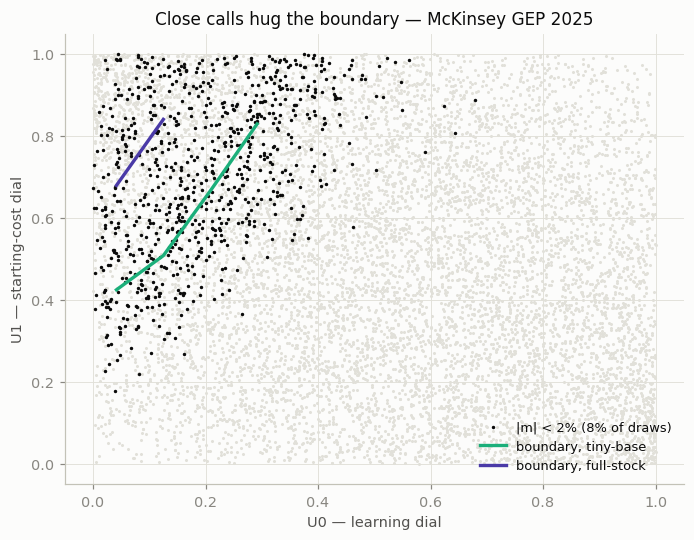

Close-call profile vs population (McKinsey GEP 2025, medians) - note U0 and conv_full: close calls concentrate in the stratum and dial region where the boundary actually lives:
                U0     U1  conv_full  n_vendors     m_usd
close calls  0.179  0.718        0.0        6.0    17.741
all draws    0.495  0.505        0.0        6.0  1176.441 

Close-call shares and functional-flip overlap (W8c preview - flips cluster at small margins, though not exclusively inside the 2% band):


,share |m|<1%,share |m|<2%,share |m|<5%,flips under undiscounted,undiscounted flips with |m|<2%,undiscounted flips with |m|<5%,flips under unweighted,unweighted flips with |m|<2%,unweighted flips with |m|<5%
schedule,,,,,,,,,
EIA 2026 AEO high,0.057,0.116,0.286,0.014,1.0,1.0,0.114,0.528,0.957
Abou-Jaoude mod,0.046,0.090,0.225,0.013,1.0,1.0,0.134,0.335,0.749
IAEA high,0.041,0.083,0.195,0.011,1.0,1.0,0.062,0.643,0.997
McKinsey GEP 2025,0.037,0.080,0.187,0.008,1.0,1.0,0.069,0.574,0.968
COP28 tripling pledge,0.031,0.063,0.159,0.007,1.0,1.0,0.060,0.509,0.946
2025 EO,0.028,0.059,0.143,0.006,1.0,1.0,0.054,0.497,0.924


In [11]:
d = D[REP]
close = d["m_pct"].abs() < EPS_CLOSE

fig, ax = plt.subplots(figsize=(6.4, 5.0))
ax.scatter(d["U0"], d["U1"], s=4, color=GRID, lw=0)
ax.scatter(d.loc[close, "U0"], d.loc[close, "U1"], s=5, color=INK, lw=0,
           label=f"|m| < {EPS_CLOSE:.0f}% ({close.mean():.0%} of draws)")
for conv, lbl, c in ((0, "boundary, tiny-base", C_TINY), (1, "boundary, full-stock", C_FULL)):
    cc, u1s, _ = boundary_curve(d, mask=(d["conv_full"] == conv).to_numpy(), nbins=12)
    ax.plot(cc, u1s, color=c, lw=2.2, label=lbl)
ax.set_xlabel("U0 — learning dial")
ax.set_ylabel("U1 — starting-cost dial")
ax.set_title(f"Close calls hug the boundary — {REP}")
ax.legend(loc="lower right", fontsize=8.5)
plt.tight_layout()
plt.show()

rows = []
for s in SCHED_ORDER:
    ds = D[s]
    r = {"schedule": s}
    for eps in (1, 2, 5):
        r[f"share |m|<{eps}%"] = (ds["m_pct"].abs() < eps).mean()
    for alt in ("undiscounted", "unweighted"):
        wl, ws = Z[f"R_{alt}_{TOK[s]}_large"], Z[f"R_{alt}_{TOK[s]}_smr"]
        flip = np.where(wl <= ws, "large", "smr") != ds["winner"].to_numpy()
        r[f"flips under {alt}"] = flip.mean()
        am = ds["m_pct"].abs().to_numpy()[flip]
        r[f"{alt} flips with |m|<2%"] = (am < 2).mean() if flip.any() else np.nan
        r[f"{alt} flips with |m|<5%"] = (am < 5).mean() if flip.any() else np.nan
    rows.append(r)
W7_TABLE = pd.DataFrame(rows).set_index("schedule").round(3)

prof = pd.DataFrame({
    "close calls": d.loc[close, ["U0", "U1", "conv_full", "n_vendors", "m_usd"]].median(),
    "all draws": d[["U0", "U1", "conv_full", "n_vendors", "m_usd"]].median()}).T.round(3)
print(f"Close-call profile vs population ({REP}, medians) - note U0 and conv_full: close "
      "calls concentrate in the stratum and dial region where the boundary actually lives:")
print(prof.to_string(), "\n")
print("Close-call shares and functional-flip overlap (W8c preview - flips cluster at small "
      "margins, though not exclusively inside the 2% band):")
W7_TABLE

## W8 — The issue-8 evidence, sub-decision by sub-decision

Each cell below ends in a printed **evidence summary**. Deliberately *evidence, not a
recommendation* — the regroup makes the call. The three sub-decisions again:

**(a) Granularity** — winner per draw (current) vs one winner per trajectory.
**(b) Distribution** — extract P5/P50/P95 from winner-cost (current) vs per-tech distributions.
**(c) Functional** — confirm discounted schedule-weighted program cost vs its alternatives.

In [12]:
# W8a - granularity: what would "one winner per trajectory" cost?
# SMR is the majority winner in every schedule, so the per-trajectory rule forces SMR everywhere.
rows, extract_rows = [], []
for s in SCHED_ORDER:
    t, ds = TOK[s], D[s]
    mis = ds["winner"] == "large"                      # draws the forced-SMR rule misassigns
    pen = ds.loc[mis, "m_usd"].abs()                   # $/kW penalty if forced wrong
    rows.append({"schedule": s, "misassigned share": mis.mean(),
                 "median penalty ($/kW)": pen.median(), "P95 penalty ($/kW)": pen.quantile(0.95),
                 "median penalty (% prog cost)": ds.loc[mis, "m_pct"].abs().median()})
    r_win = np.where(ds["winner"] == "large", ds["R_large"], ds["R_smr"])
    o_def, o_forced = np.argsort(r_win), np.argsort(ds["R_smr"].to_numpy())
    for pname, q in (("p05", 0.05), ("p50", 0.50), ("p95", 0.95)):
        k = int(round(q * (len(ds) - 1)))
        dd, df = int(o_def[k]), int(o_forced[k])
        tech_d = ds["winner"].iloc[dd]
        f_d = Z[f"fincapex_{t}_{tech_d}"][dd, yi(2050)]
        f_f = Z[f"fincapex_{t}_smr"][df, yi(2050)]
        extract_rows.append({"schedule": s, "pct": pname, "default draw": dd,
                             "default tech": tech_d, "forced-SMR draw": df,
                             "case changes": dd != df,
                             "Δ 2050 fincapex (%)": 100 * (f_f - f_d) / f_d})
W8A = pd.DataFrame(rows).set_index("schedule").round(3)
W8A_CASES = pd.DataFrame(extract_rows)
print(W8A.to_string(), "\n")
chg = W8A_CASES.groupby("pct")["case changes"].sum()
dmax = W8A_CASES.groupby("pct")["Δ 2050 fincapex (%)"].apply(lambda x: x.abs().max())
print("Effect on the 18 exported cases if extraction were re-run under forced-SMR:")
print(pd.DataFrame({"cases changed (of 6)": chg, "max |Δ 2050 fincapex| %": dmax.round(1)}).to_string(), "\n")
print("EVIDENCE SUMMARY (a): forcing one winner per trajectory misassigns "
      f"{W8A['misassigned share'].min():.0%}-{W8A['misassigned share'].max():.0%} of draws, at a "
      f"median penalty of {W8A['median penalty (% prog cost)'].min():.1f}-"
      f"{W8A['median penalty (% prog cost)'].max():.1f}% of program cost on those draws. For "
      "the exported cases: the p05 end is untouched (cheap worlds are SMR worlds under either "
      "rule); p50 identities can shift because forcing SMR reorders the whole ranking, but the "
      "replacement draws are similar SMR worlds (small trajectory deltas); the p95 end changes "
      "most - the expensive tail is where large wins, so a forced-SMR high case swaps a "
      "large-reactor world for a more expensive SMR world (largest deltas above). "
      "Winner-per-draw also keeps the win-probability table (W2) as a paper deliverable; "
      "per-trajectory discards it.")

                       misassigned share  median penalty ($/kW)  P95 penalty ($/kW)  median penalty (% prog cost)
schedule                                                                                                         
EIA 2026 AEO high                  0.181                364.572            1015.103                         3.346
Abou-Jaoude mod                    0.146                379.594            1060.691                         3.643
IAEA high                          0.137                406.095            1103.825                         4.016
McKinsey GEP 2025                  0.133                406.927            1083.075                         4.191
COP28 tripling pledge              0.122                431.433            1144.273                         4.604
2025 EO                            0.114                406.138            1173.294                         4.455 

Effect on the 18 exported cases if extraction were re-run under forced-SMR:
     cases

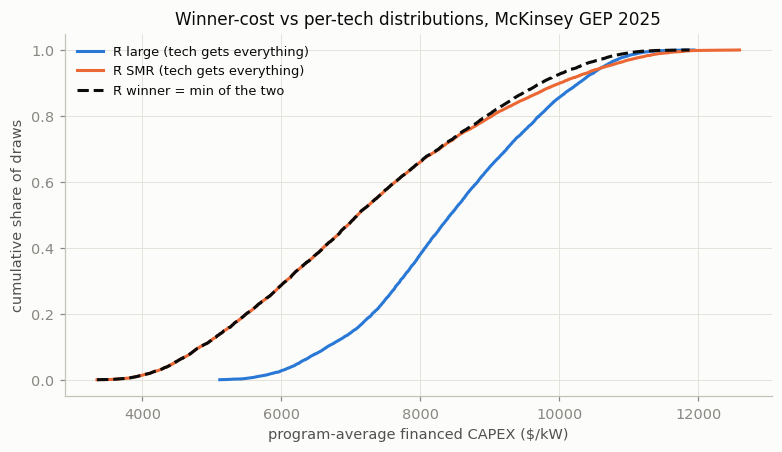

                      P5 winner tech  P5 R̄ winner P50 winner tech  P50 R̄ winner P95 winner tech  P95 R̄ winner  P95 R̄ large (per-tech)  P95 R̄ smr (per-tech)
schedule                                                                                                                                                        
EIA 2026 AEO high                smr        6004.0             smr         8648.0             smr        11344.0                  11543.0                11781.0
Abou-Jaoude mod                  smr        5364.0             smr         8014.0             smr        10909.0                  11207.0                11307.0
IAEA high                        smr        4737.0             smr         7407.0             smr        10476.0                  10844.0                10873.0
McKinsey GEP 2025                smr        4454.0             smr         7099.0           large        10295.0                  10644.0                10672.0
COP28 tripling pledge            s

In [13]:
# W8b - distribution: winner-cost vs per-tech percentiles
d = D[REP]
Rb_win = np.minimum(d["Rbar_large"], d["Rbar_smr"])

fig, ax = plt.subplots(figsize=(7.2, 4.2))
for series, color, ls, name in ((d["Rbar_large"], C_LARGE, "-", "R̄ large (tech gets everything)"),
                                (d["Rbar_smr"], C_SMR, "-", "R̄ SMR (tech gets everything)"),
                                (Rb_win, INK, "--", "R̄ winner = min of the two")):
    xs = np.sort(np.asarray(series))
    ax.plot(xs, np.arange(1, len(xs) + 1) / len(xs), color=color, ls=ls, lw=2, label=name)
ax.set_xlabel("program-average financed CAPEX ($/kW)")
ax.set_ylabel("cumulative share of draws")
ax.set_title(f"Winner-cost vs per-tech distributions, {REP}")
ax.legend(fontsize=8.5)
plt.tight_layout()
plt.show()

rows = []
for s in SCHED_ORDER:
    ds = D[s]
    rbw = np.minimum(ds["Rbar_large"], ds["Rbar_smr"])
    r_win = np.where(ds["winner"] == "large", ds["R_large"], ds["R_smr"])
    o = np.argsort(r_win)
    row = {"schedule": s}
    for pname, q in (("P5", 0.05), ("P50", 0.50), ("P95", 0.95)):
        k = int(o[int(round(q * (len(ds) - 1)))])
        row[f"{pname} winner tech"] = ds["winner"].iloc[k]
        row[f"{pname} R̄ winner"] = rbw.iloc[k].round(0)
    row["P95 R̄ large (per-tech)"] = ds["Rbar_large"].quantile(0.95).round(0)
    row["P95 R̄ smr (per-tech)"] = ds["Rbar_smr"].quantile(0.95).round(0)
    rows.append(row)
W8B = pd.DataFrame(rows).set_index("schedule")
print(W8B.to_string(), "\n")
print("EVIDENCE SUMMARY (b): the winner distribution's high tail is populated by LARGE worlds - "
      "min() hands the expensive tail to whichever tech caps lower, and large's anchor caps at "
      "$7,750/kW vs SMR's $10,000. That is the geometric reason the exported P95 cases "
      "gravitate to large-winner draws (the stars above the line in W2). It is a modeling choice with meaning, "
      "not an artifact: 'a bad world for nuclear' = 'a world where even the cheaper option is "
      "expensive'. The per-tech alternative would need 36 cases (or pick a tech inconsistent "
      "with winner-take-all) and its P95s are higher than the winner-P95 by construction.")

In [14]:
# W8c - ranking functional: does the choice of functional change anything that matters?
FUNCS = ["default", "undiscounted", "unweighted"]

def winners_under(s, func):
    t = TOK[s]
    pre = "R" if func == "default" else f"R_{func}"
    return (np.where(Z[f"{pre}_{t}_large"] <= Z[f"{pre}_{t}_smr"], "large", "smr"),
            Z[f"{pre}_{t}_large"], Z[f"{pre}_{t}_smr"])

inv = pd.read_csv(EXPORTS / "winner_ranking_invariance.csv", index_col=[0, 1])
rows, case_rows = [], []
for s in SCHED_ORDER:
    W = {f: winners_under(s, f) for f in FUNCS}
    row = {"schedule": s}
    for f in ("undiscounted", "unweighted"):
        agree = (W["default"][0] == W[f][0]).mean()
        row[f"agree {f}"] = agree
        # reconcile with the MC's own QA export
        assert abs(agree - inv.loc[(s, f)].iloc[0]) < 2e-3, (s, f)
        row[f"Δ P(smr) {f}"] = (W[f][0] == "smr").mean() - (W["default"][0] == "smr").mean()
    rows.append(row)
    for f in FUNCS:                     # case extraction under each functional
        w, rl, rs = W[f]
        r_win = np.where(w == "large", rl, rs)
        o = np.argsort(r_win)
        for pname, q in (("p05", 0.05), ("p50", 0.50), ("p95", 0.95)):
            k = int(o[int(round(q * (len(w) - 1)))])
            fc = Z[f"fincapex_{TOK[s]}_{w[k]}"][k, yi(2050)]
            case_rows.append({"schedule": s, "functional": f, "pct": pname, "draw": k,
                              "tech": w[k], "fin2050": fc})
W8C = pd.DataFrame(rows).set_index("schedule").round(4)
cases = pd.DataFrame(case_rows)
piv = cases.pivot_table(index=["schedule", "pct"], columns="functional", values="draw",
                        aggfunc="first")[FUNCS]
fin = cases.pivot_table(index=["schedule", "pct"], columns="functional", values="fin2050",
                        aggfunc="first")[FUNCS]
print(W8C.to_string(), "\n")
for f in ("undiscounted", "unweighted"):
    n_chg = int((piv[f] != piv["default"]).sum())
    dpct = 100 * (fin[f] - fin["default"]).abs() / fin["default"]
    print(f"vs '{f}': {n_chg}/18 case identities change; the selected winner's 2050 financed "
          f"CAPEX moves by median {dpct.median():.1f}%, max {dpct.max():.1f}%")
print()
dis_ud = 1 - W8C["agree undiscounted"]
dis_uw = 1 - W8C["agree unweighted"]
ov2 = W7_TABLE["unweighted flips with |m|<2%"].mean()
ov5 = W7_TABLE["unweighted flips with |m|<5%"].mean()
print(f"EVIDENCE SUMMARY (c): the undiscounted variant disagrees with the default on only "
      f"{dis_ud.min():.1%}-{dis_ud.max():.1%} of draws; the unweighted variant disagrees on "
      f"{dis_uw.min():.0%}-{dis_uw.max():.0%}, and W7 shows those flips cluster at small "
      f"margins ({ov2:.0%} inside the 2% band, {ov5:.0%} inside 5%, averaged over schedules). "
      "Case IDENTITIES are not stable across functionals - percentile neighborhoods are dense, "
      "so almost any reordering picks a different draw - but the MATERIAL content of the "
      "selected cases moves far less (see the trajectory deltas above). The default also "
      "matches the discounting the issue-5 subsidy formula will use (shared machinery); the "
      "undiscounted alternative is near-equivalent, the unweighted one is the outlier.")

                       agree undiscounted  Δ P(smr) undiscounted  agree unweighted  Δ P(smr) unweighted
schedule                                                                                               
EIA 2026 AEO high                  0.9858                 0.0138            0.8855              -0.1145
Abou-Jaoude mod                    0.9868                 0.0124            0.8655              -0.1343
IAEA high                          0.9894                 0.0080            0.9375              -0.0625
McKinsey GEP 2025                  0.9917                 0.0051            0.9313              -0.0685
COP28 tripling pledge              0.9931                 0.0039            0.9405              -0.0583
2025 EO                            0.9941                 0.0045            0.9459              -0.0531 

vs 'undiscounted': 18/18 case identities change; the selected winner's 2050 financed CAPEX moves by median 3.8%, max 19.5%
vs 'unweighted': 18/18 case identities chan

## W9 — Robustness: does any of this depend on the schedule?

**The question.** Everything above deep-dived one schedule. Do the boundary, the win
probabilities, and the functional conclusions hold across all six?

**What you'll see.** The boundary shifts *up* (SMR territory grows) with schedule ambition, but
modestly — no crossings, no shape change. The left panel shows the **tiny-base** boundaries —
large's best case, and the only convention where a boundary survives beyond the extreme
slow-learning corner (under full-stock it exits the sampled anchor range almost immediately;
the table reports both exit points). P(SMR) rises broadly with program size — the dip at
Abou-Jaoude shows schedule *shape* matters, not just the 2050 endpoint. Mechanism: bigger
programs build more units, and SMR's 3.33× units-per-GW converts program scale into
series-position advantage faster than large can. The summary table is the whole notebook in
six rows.

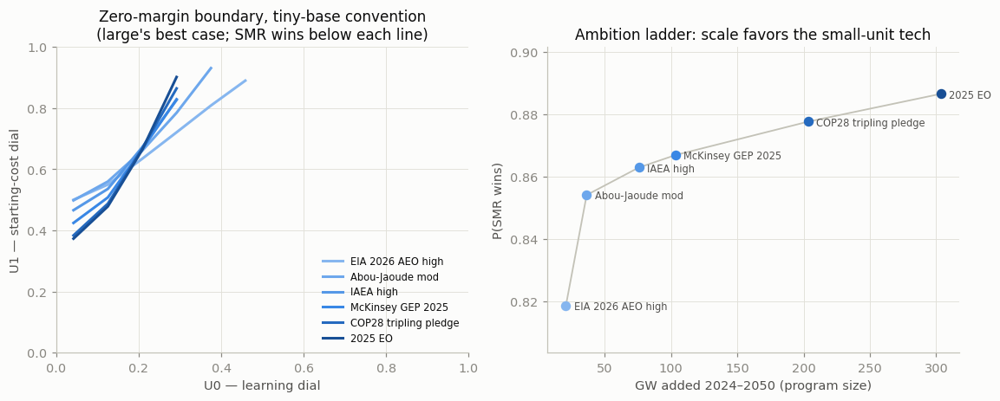

,GW added by 2050,P(smr wins),median m_pct (%),share |m|<2%,"break-even premium @U0=0.2, tiny-base ($/kW)",tiny-base U0 exit,full-stock U0 exit,agree undiscounted,agree unweighted
schedule,,,,,,,,,
EIA 2026 AEO high,21,0.819,9.255,0.116,1502.217,0.542,0.375,0.986,0.886
Abou-Jaoude mod,36,0.854,12.375,0.090,1551.509,0.458,0.292,0.987,0.866
IAEA high,76,0.863,14.955,0.083,1567.272,0.375,0.208,0.989,0.938
McKinsey GEP 2025,103,0.867,15.874,0.080,1549.594,0.375,0.208,0.992,0.931
COP28 tripling pledge,203,0.878,18.940,0.063,1550.377,0.375,0.125,0.993,0.940
2025 EO,303,0.886,21.407,0.059,1540.346,0.375,0.125,0.994,0.946


In [15]:
fig, axes = plt.subplots(1, 2, figsize=(10.6, 4.3))

ax = axes[0]
for c, s in zip(SEQ6, SCHED_ORDER):
    cc, u1s, _ = boundary_curve(D[s], mask=(D[s]["conv_full"] == 0).to_numpy(), nbins=12)
    ax.plot(cc, u1s, color=c, lw=2, label=s)
ax.set_xlim(0, 1); ax.set_ylim(0, 1)
ax.set_xlabel("U0 — learning dial")
ax.set_ylabel("U1 — starting-cost dial")
ax.set_title("Zero-margin boundary, tiny-base convention\n(large's best case; SMR wins below each line)")
ax.legend(fontsize=7.5, loc="lower right")

ax = axes[1]
gw = [Z[f"gw_additions_{TOK[s]}"].sum() for s in SCHED_ORDER]
psmr = [(D[s]["winner"] == "smr").mean() for s in SCHED_ORDER]
ax.plot(gw, psmr, "-", color=BASE, lw=1.2, zorder=1)
for c, s, x, y in zip(SEQ6, SCHED_ORDER, gw, psmr):
    ax.scatter(x, y, color=c, s=42, zorder=3)
    ax.annotate(s, (x, y), textcoords="offset points", xytext=(6, -3), fontsize=7.5, color=INK2)
ax.set_xlabel("GW added 2024–2050 (program size)")
ax.set_ylabel("P(SMR wins)")
ax.set_ylim(min(psmr) - 0.015, max(psmr) + 0.015)
ax.set_title("Ambition ladder: scale favors the small-unit tech")
plt.tight_layout()
plt.show()

rows = []
for s in SCHED_ORDER:
    ds = D[s]
    cc, u1s, exit_tiny = boundary_curve(ds, mask=(ds["conv_full"] == 0).to_numpy(), nbins=12)
    ok = ~np.isnan(u1s)
    be = np.interp(0.2, cc[ok], u1s[ok]) if ok.sum() > 1 else np.nan
    _, _, exit_full = boundary_curve(ds, mask=(ds["conv_full"] == 1).to_numpy(), nbins=12)
    rows.append({"schedule": s, "GW added by 2050": round(Z[f"gw_additions_{TOK[s]}"].sum()),
                 "P(smr wins)": (ds["winner"] == "smr").mean(),
                 "median m_pct (%)": ds["m_pct"].median(),
                 "share |m|<2%": (ds["m_pct"].abs() < 2).mean(),
                 "break-even premium @U0=0.2, tiny-base ($/kW)": 250 + 2000 * be,
                 "tiny-base U0 exit": exit_tiny,
                 "full-stock U0 exit": exit_full,
                 "agree undiscounted": W8C.loc[s, "agree undiscounted"],
                 "agree unweighted": W8C.loc[s, "agree unweighted"]})
W9_TABLE = pd.DataFrame(rows).set_index("schedule").round(3)
W9_TABLE.to_csv(EXPORTS / "wb_schedule_summary.csv")
W9_TABLE

## W10 — Four numbers to remember, and the decision framing

In [16]:
# The four summary ratios, computed from the sections above (representative schedule).
d = D[REP]
be = W5_BREAKEVEN.set_index(["convention", "U0"])

# 1 - where large can still win, by convention (tiny-base is large's best case)
prem_t02 = be.loc[("tiny-base", 0.2), "break-even SMR premium ($/kW)"]
boak_t02 = be.loc[("tiny-base", 0.2), "break-even boak_large ($/kW)"]
exit_tiny, exit_full = U0_EXIT["tiny-base"], U0_EXIT["full-stock"]
lr_ex_t = 100 * (0.03 + 0.09 * exit_tiny)
lr_ex_f = 100 * (0.03 + 0.09 * exit_full)

# 2 - learning-for-cost exchange rate from the tiny-base boundary slope dU1*/dU0
cc_tb, u1s_tb, _ = boundary_curve(d, mask=(d["conv_full"] == 0).to_numpy(), nbins=12)
ok = ~np.isnan(u1s_tb)
slope = np.polyfit(cc_tb[ok], u1s_tb[ok], 1)[0]
xrate_gap = 2000 * slope / 4.0     # $/kW of break-even premium per pp of SMR's lr edge over large
xrate_lr = 2000 * slope / 9.0      # per pp of the industry-wide learning rate itself

# 3 - close calls and functional overlap
close_share = (d["m_pct"].abs() < EPS_CLOSE).mean()
ovl2 = W7_TABLE.loc[REP, "unweighted flips with |m|<2%"]
ovl5 = W7_TABLE.loc[REP, "unweighted flips with |m|<5%"]

# 4 - advantage decomposition (mind the signs)
med_m = W3_DECOMP.loc[REP, "median m_pct (%)"]
occ_pp = W3_DECOMP.loc[REP, "OCC-only part (pp)"]
fin_pp = W3_DECOMP.loc[REP, "financing part (pp)"]
occ_note = ("large is usually CHEAPER on pure OCC" if occ_pp < 0
            else "OCC learning already favors SMR")

print(f"""FOUR NUMBERS TO REMEMBER ({REP}; see W3/W4/W5/W7 for derivations)

1. WHERE LARGE CAN STILL WIN (W5). Only in the slow-learning corner. Under
   TINY-BASE (large's best case: an uncredited fleet starts steep and learns
   fast), at U0 = 0.2 (lr_large ≈ 4.8%) SMR can cost up to ~{prem_t02:,.0f} $/kW MORE
   than large at the 2030 anchor and still win (large anchor at the boundary:
   ~{boak_t02:,.0f} $/kW); beyond U0 ≈ {exit_tiny:.2f} (lr_large ≈ {lr_ex_t:.1f}%) SMR wins at any
   anchor in the sampled ranges. Under FULL-STOCK the boundary collapses to
   U0 ≈ {exit_full:.2f} (lr_large ≈ {lr_ex_f:.1f}%): crediting the ~140-unit legacy fleet to
   large's base dilutes its learning progression and paradoxically WEAKENS its case.

2. LEARNING-FOR-COST EXCHANGE RATE (W5, tiny-base boundary). Along the boundary,
   each 1 pp of SMR's learning-rate edge over large buys ~{xrate_gap:,.0f} $/kW of
   tolerable anchor premium (~{xrate_lr:,.0f} $/kW per pp of the shared industry
   learning rate).

3. CLOSE CALLS (W7). {close_share:.0%} of worlds sit within {EPS_CLOSE:.0f}% of program cost of the
   flip. Of the draws that flip winner under the alternative 'unweighted'
   functional, {ovl2:.0%} are inside that 2% band and {ovl5:.0%} inside the 5% band -
   functional disagreements cluster where the answer matters least.

4. WHERE SMR'S ADVANTAGE COMES FROM (W3). The median margin is +{med_m:.1f}% of
   program cost: {occ_pp:+.1f} pp from overnight cost alone ({occ_note}) and
   {fin_pp:+.1f} pp from financing (shorter builds -> less IDC, lighter financing).""")

FOUR NUMBERS TO REMEMBER (McKinsey GEP 2025; see W3/W4/W5/W7 for derivations)

1. WHERE LARGE CAN STILL WIN (W5). Only in the slow-learning corner. Under
   TINY-BASE (large's best case: an uncredited fleet starts steep and learns
   fast), at U0 = 0.2 (lr_large ≈ 4.8%) SMR can cost up to ~1,550 $/kW MORE
   than large at the 2030 anchor and still win (large anchor at the boundary:
   ~6,874 $/kW); beyond U0 ≈ 0.38 (lr_large ≈ 6.4%) SMR wins at any
   anchor in the sampled ranges. Under FULL-STOCK the boundary collapses to
   U0 ≈ 0.21 (lr_large ≈ 4.9%): crediting the ~140-unit legacy fleet to
   large's base dilutes its learning progression and paradoxically WEAKENS its case.

2. LEARNING-FOR-COST EXCHANGE RATE (W5, tiny-base boundary). Along the boundary,
   each 1 pp of SMR's learning-rate edge over large buys ~823 $/kW of
   tolerable anchor premium (~366 $/kW per pp of the shared industry
   learning rate).

3. CLOSE CALLS (W7). 8% of worlds sit within 2% of program cost of the
  

### Decision framing for the regroup

| sub-decision | evidence | what each option implies |
|---|---|---|
| **(a) granularity** — winner per draw vs per trajectory | W2 (margins), W7 (close calls), **W8a** | *Per draw* (current): keeps win probabilities as a paper deliverable; every case internally consistent. *Per trajectory*: forces SMR on the minority of worlds where large wins (W8a quantifies) — harmless at the cheap end, but it **replaces the p95 (high-cost) cases**, which gravitate to large-winner worlds. |
| **(b) distribution** — winner-cost vs per-tech percentiles | W2b (stars), **W8b** | *Winner-cost* (current): 18 coherent cases; the high case can switch tech — that is the min() geometry, not a bug. *Per-tech*: 36 cases or a forced-tech inconsistency; higher P95s by construction. |
| **(c) functional** — confirm the default | W7 (overlap), **W8c**, W9 | *Default* (discounted, schedule-weighted): matches the issue-5 subsidy discounting. *Undiscounted*: near-equivalent. *Unweighted*: the outlier, and its flips cluster at small margins (W7/W8c quantify). Case identities shift under any reordering, but the selected trajectories move much less (W8c quantifies). |

**Scope caveats.** Everything above conditions on the MC's structural choices: comonotone
learning rates and anchors (the two-dial reduction is exact only under that copula), zero
domestic cross-tech spillover, and the financed-CAPEX winner metric (the non-CAPEX parameter
check — FOM, CF, lifetime — is a separate pre-regroup item per the paper plan). Re-run this
notebook after any MC engine change: it reads `exports/mc_perdraw.npz`, so refresh that first.